# Tutorial: Key point detection

A key point problem is a variant of image regression in which a "key point" refers to a specific location represented in an image. 

In this tutorial, we'll be looking for the centre of the person's face in each image, predicting two values for each image: the row and column of the face centre. The full fastai tutorial can be found in their notebook manual:
* https://github.com/fastai/fastbook/blob/master/06_multicat.ipynb

This problem can then be expanded to find the centroid of an asteroid!

## Setup the GPU

Before starting, you will need to set colab to use the GPU:
* Go to Edit > Notebook settings or Runtime > Change runtime type and select GPU as Hardware accelerator.
* https://medium.com/deep-learning-turkey/google-colab-free-gpu-tutorial-e113627b9f5d

## Install Fastai libraries

The fastai2 library is not pre-installed in colab so we first need to pip install it. Using "!" at the beginning of a cell in a Jupyter notebook runs a shell command inside the notebook, and installs the library directly to the colab virtual machine. You only need to rerun this when restarting the kernel.

In [0]:
!pip3 install fastai2

     |████████████████████████████████| 194kB 3.4MB/s 


Any machine learning task that involves understading images falls into the area of *Computer Vision*. In fastai, all the modules related to computer vision can be found under *fastai.vision*.

In [0]:
from fastai2 import *
from fastai2.vision.all import *

In [0]:
import numpy as np
import pandas as pd

## Download & Access Data

We will use a dataset hosted by fastai for this tutorial which contains images (.jpg files) and the coordinates of the centre of the faces on each image in their corresponding pose.txt file. These are grouped into 24 different directories, each containing independent photographs of different people.

In [0]:
path = untar_data(URLs.BIWI_HEAD_POSE)

In [0]:
path.ls()

(#50) [Path('/root/.fastai/data/biwi_head_pose/24'),Path('/root/.fastai/data/biwi_head_pose/18'),Path('/root/.fastai/data/biwi_head_pose/17'),Path('/root/.fastai/data/biwi_head_pose/16.obj'),Path('/root/.fastai/data/biwi_head_pose/20.obj'),Path('/root/.fastai/data/biwi_head_pose/09'),Path('/root/.fastai/data/biwi_head_pose/09.obj'),Path('/root/.fastai/data/biwi_head_pose/04.obj'),Path('/root/.fastai/data/biwi_head_pose/02.obj'),Path('/root/.fastai/data/biwi_head_pose/20')...]

In [0]:
Path.BASE_PATH = path

In [0]:
path.ls().sorted()

(#50) [Path('01'),Path('01.obj'),Path('02'),Path('02.obj'),Path('03'),Path('03.obj'),Path('04'),Path('04.obj'),Path('05'),Path('05.obj')...]

In [0]:
(path/'01').ls().sorted()

(#1000) [Path('01/depth.cal'),Path('01/frame_00003_pose.txt'),Path('01/frame_00003_rgb.jpg'),Path('01/frame_00004_pose.txt'),Path('01/frame_00004_rgb.jpg'),Path('01/frame_00005_pose.txt'),Path('01/frame_00005_rgb.jpg'),Path('01/frame_00006_pose.txt'),Path('01/frame_00006_rgb.jpg'),Path('01/frame_00007_pose.txt')...]

In [0]:
img_files = get_image_files(path)

In [0]:
im = PILImage.create(img_files[0])
im.shape

(480, 640)

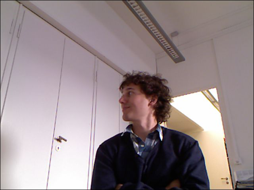

In [0]:
im.to_thumb(254)

## Preprocess Data

For each image, we need to be able to load in the location of the centre of the head.

In [0]:
def img2pose(x): return Path(f'{str(x)[:-7]}pose.txt')

In [0]:
cal = np.genfromtxt(path/'01'/'rgb.cal', skip_footer=6)
def get_ctr(f):
    ctr = np.genfromtxt(img2pose(f), skip_header=3)
    c1 = ctr[0] * cal[0][0]/ctr[2] + cal[0][2]
    c2 = ctr[1] * cal[1][1]/ctr[2] + cal[1][2]
    return tensor([c1,c2])

For fastai2, we need to load each image (ImageBlock) and head coordinate (PointBlock) into a specific DataBlock format:
* **get_y** calls the above function for each image (as loaded in from **get_items**) to load in the image and associated coordinates.
* **splitter** specifies how to split the data into a training set and a validation set. As we want our model to be tested on an unseen validation set, we choose all the images from the 13th directory (containing photographs of unseen people).
* **batch_tfms** defines any transformations we want to do after the images have been batched for training (this is more efficient as it means the transforms are performed on the GPU). Here, we can normalise the data, resize the images and perform **data augmentation** techniques to try and help the model generalise well:
    * Flip(), Rotate(), Zoom(), Warp(), Brightness(), Contrast()
    * (**Tip**: here we need to ensure that our choice of data augmentation techniques also translate the key point coordinates in our PointBlock and not just the image: see this thread for more options and information: https://forums.fast.ai/t/useful-tip-transforms-supported-for-point-regression-tensorpoint/62549)

In [0]:
batch_tfms = [*aug_transforms(size=(240,320)), Normalize.from_stats(*imagenet_stats)]

dblock = DataBlock(blocks    = (ImageBlock, PointBlock),
                   get_items = get_image_files,
                   get_y     = get_ctr,
                   splitter  = FuncSplitter(lambda o: o.parent.name=='13'),
                   batch_tfms= batch_tfms)

In [0]:
# debugging the DataBlock
#dblock.summary('')

We then call the DataBlock on our image set at path and choose a **batch size**. Higher batch sizes are more computationally expensive but lead to faster convergence: if your images are too large, you will have to choose a smaller batch size, so we resized them above.

In [0]:
dls = dblock.dataloaders(path, bs=16)

In [0]:
print("Number of images in the training vs validation sets: {}, {}".format(dls.train.n, dls.valid.n))

Number of images in the training vs validation sets: 15193, 485


Check whether the data looks ok before training:

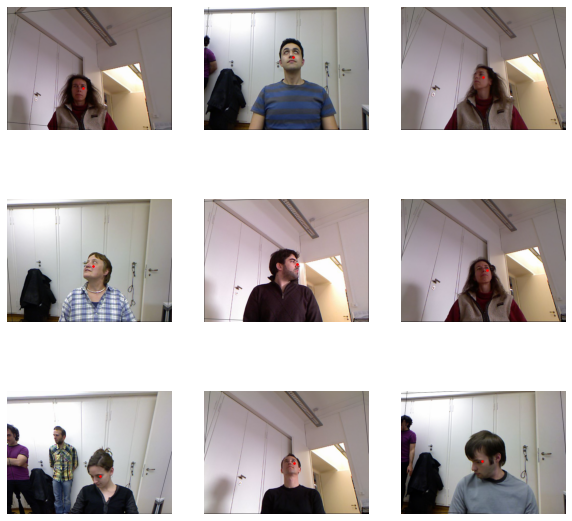

In [0]:
dls.show_batch(max_n=9, figsize=(10,10))

What are the dimensions of your dataset?
* The Images are defined by the batch size, number of channels (e.g. rgb), and image dimension
* The point coordinates are defined by the batch size and the fact that there are 2 coordinates per image (x,y)

In [0]:
xb,yb = dls.one_batch()
xb.shape,yb.shape

(torch.Size([16, 3, 480, 640]), torch.Size([16, 1, 2]))

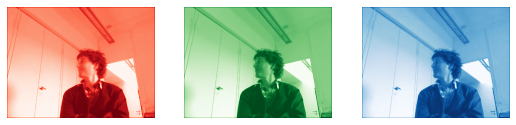

In [0]:
im = image2tensor(Image.open(img_files[0]))
_,axs = subplots(1,3)
for i,ax,color in zip(im,axs,('Reds','Greens','Blues')):
    show_image(255-i, ax=ax, cmap=color)

## Training a Model

As we are working with images, we will make use of **transfer learning** to improve our accuracy and convergence speed by using a pre-trained model.

Here, we make use of **ResNet**, a classic neural network used as a backbone for many computer vision tasks. This model was the winner of ImageNet challenge in 2015. The ImageNet challenge was a classification task for thousands of image categories, and millions of images.



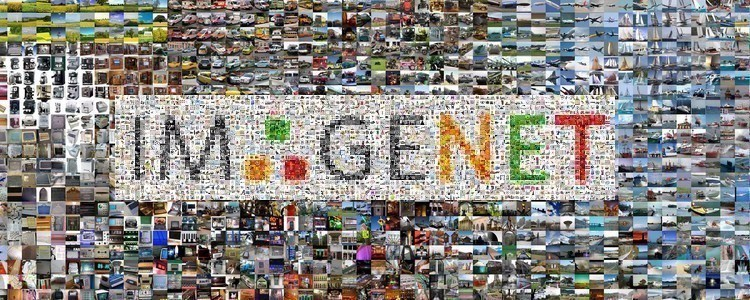

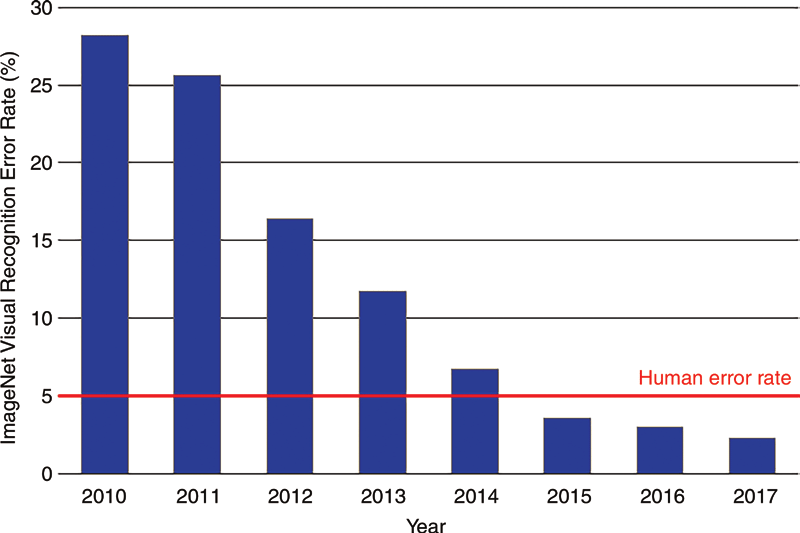

With transfer learning, we can take this pre-trained classification model and use it for a task that is different to what it was originally trained for: our **regression** problem.

We keep and freeze the first layers of the network, which have been trained on the large imagenet dataset. These early layers have already learnt about what edges and colours look like. Later layers of this network have learnt the specific characteristics of e.g. dog breeds, that we are not interested in, so we remove these layers and replace them with random weights.

Then, we only optimise these last few layers, which are tailored towards our smaller specific dataset. This approach is faster and requires much less data than learning from scratch.

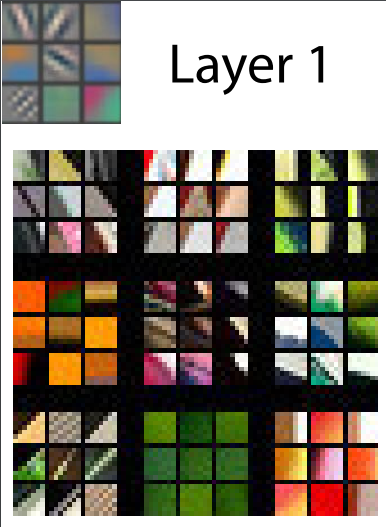

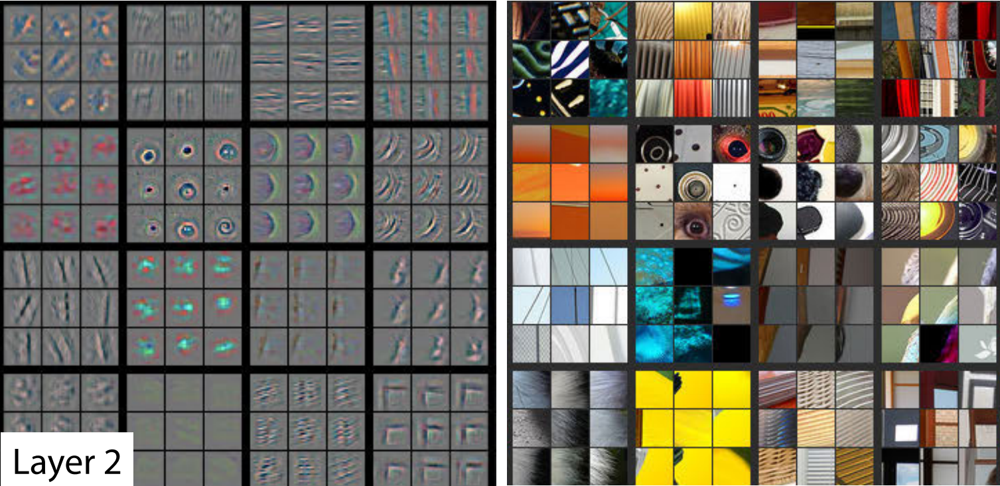

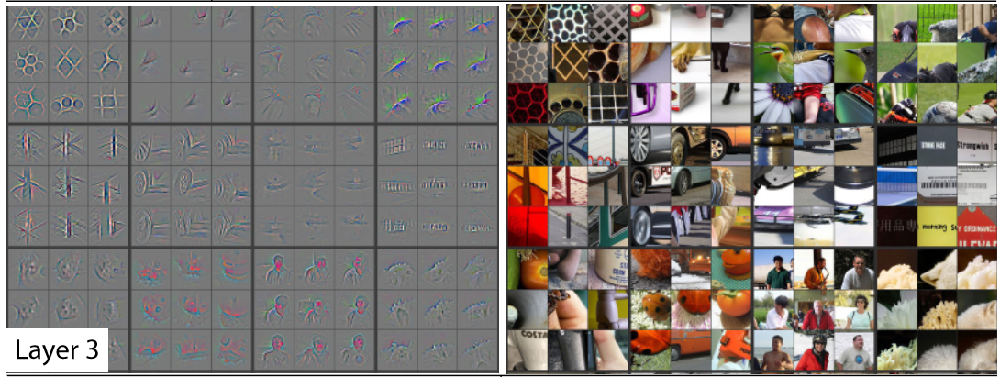

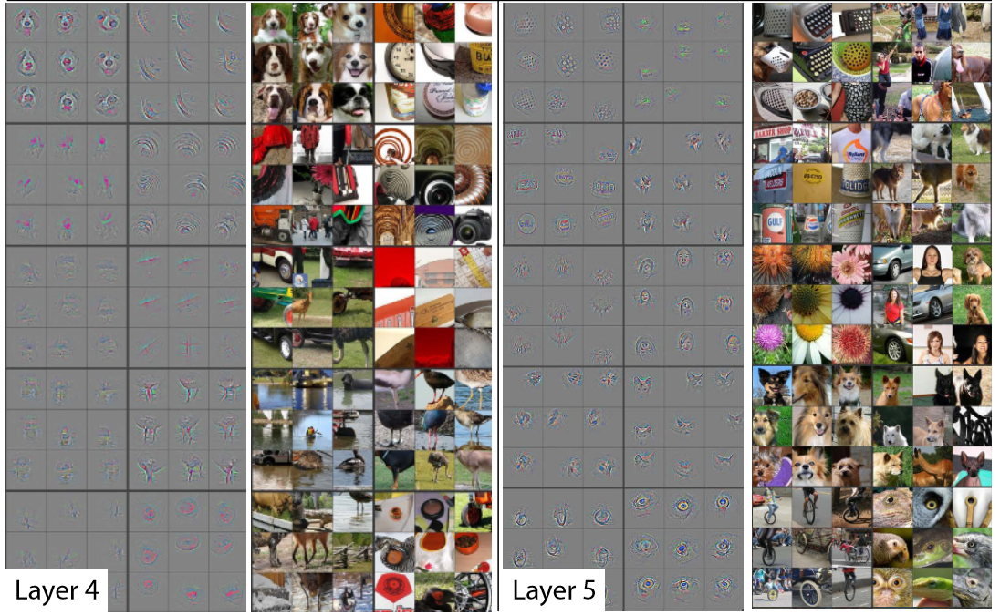

First, we set up a learner object:
* We use a convolutional neural network (cnn) with weights pre-trained on ImageNet data (from resnet). This function has been designed for transfer learning and initialises the weights on the latter layers (the head) randomly.
    * When choosing the number of layers to use from resnet: always start with a lower number of layers when exploring the training as it is much faster. Increasing the number of layers might not lead to better results, and increases the likelihood of overfitting.

* Since we're predicting a continuous number, rather than a category, we have to tell fastai what range our target has, using the y_range parameter.

* We can specify which metrics we are interested in for evaluating how the model performs on the validation dataset. Available built in metrics can be found in: https://github.com/fastai/fastai2/blob/master/fastai2/metrics.py. 


In [0]:
learn = cnn_learner(dls, resnet18, y_range=(-1,1), metrics=[mse, mae]) # try resnet18, resnet34, resnet50

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/checkpoints/resnet18-5c106cde.pth


Here, the default loss function is the mean square error (typical for regression problems).

In [0]:
dls.loss_func

FlattenedLoss of MSELoss()

**Choosing your learning rate:**

The learning rate is often one of the most important parameters as it is used to define the step size in the optimisation:

* Learning rate too low: very small steps: large number of epochs needed to converge
* Learning rate too high: large steps: loss starts to increase and you diverge
* Don't want to choose the minimum: this is the point at which the model is not learning any more, it is not improving...

Good choices:
* The steepest gradient: the learning rate for which the model is improving the most
* Rule of thumb: an order of magnitude less than the minimum

**Human in the loop**: the shape of the learning rate finder might be such that the returned suggested values are not the best for your problem...

SuggestedLRs(lr_min=7.585775847473997e-08, lr_steep=6.309573450380412e-07)

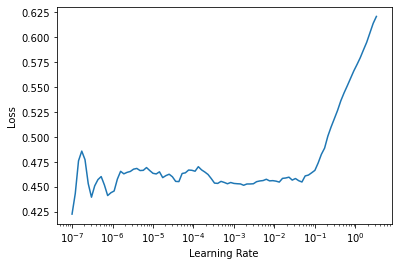

In [0]:
suggested_lrs = learn.lr_find()
suggested_lrs

In [0]:
# choose learning rate based on lr_finder

lr = suggested_lrs.lr_steep

Fine tuning is the fastai helper for transfer learning. First, we have one epoch where we initalise the weights of the pre-trained ResNet model and train the whole network once. Then we freeze these layers, and only train the last layers of the network which are specific to our data.

In [0]:
learn.fine_tune(epochs=3, base_lr=lr)

epoch,train_loss,valid_loss,mse,mae,time
0,0.402091,0.231889,0.231889,0.404809,02:22


epoch,train_loss,valid_loss,mse,mae,time
0,0.383483,0.174924,0.174924,0.348074,02:48
1,0.381297,0.196985,0.196985,0.367655,02:47
2,0.378493,0.135382,0.135382,0.303356,02:46


In [0]:
# choose learning rate based on lr_finder

lr = 5e-3

Fastai uses callbacks to help you customise your training: here we want to save which is the best model through training, and reload that at the end.

In [0]:
# define callback to save best model
cb = SaveModelCallback(fname="best")

In [0]:
learn.fine_tune(epochs=2, base_lr=lr, cbs=[cb])

epoch,train_loss,valid_loss,mse,mae,time
0,0.025444,0.004414,0.004414,0.056987,07:20


epoch,train_loss,valid_loss,mse,mae,time
0,0.005779,0.004249,0.004249,0.054545,09:57
1,0.002271,0.000936,0.000936,0.028062,09:55


In [0]:
print("Best MSE (loss): {}".format(cb.best))
print("Prediction error: {:.4}%".format(np.sqrt(cb.best)*100))

Best MSE (loss): 0.0009356908849440515
Prediction error: 3.059%


Beware of overfitting, when the validation losses start to increase.

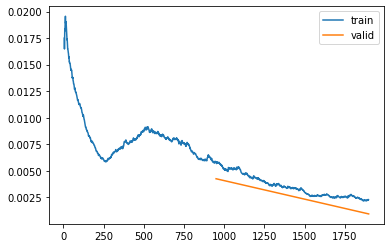

In [0]:
learn.recorder.plot_loss()

Fastai implements a learning rate scheme called "fit one cycle", where the learning rates are varied over the course of training to improve convergence. This includes a **warm-up** stage, where the learning rates are smaller at the beginning of training, before building up to a maximum learning rate and then decaying towards the end. For best results, these smaller learning rates at the end of training should not be wasted on epochs which are overfitting.


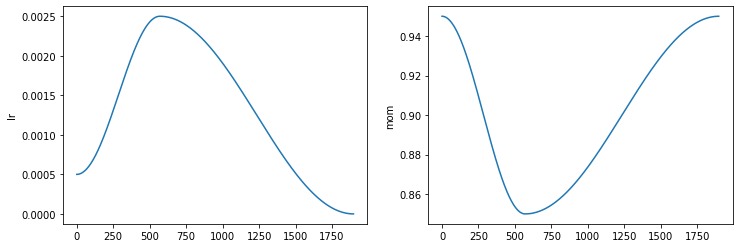

In [0]:
learn.recorder.plot_sched()

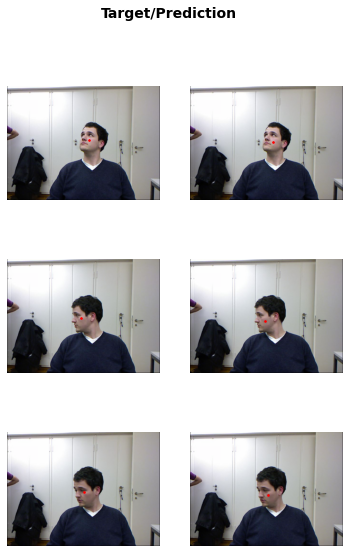

In [0]:
learn.show_results(ds_idx=1) #figsize=(6,8))

## Understanding the results

### Baseline

Will using deep learning lead to a measureable improvement on more traditional, or more easily interpretable, methods? 

Here we calculate predictive accuracy obtained using a dummy baseline, in which we predict the centre of the face is the centre of the image, to compare to our ML results.

Retrieve true coordinates of centre of face from the validation data set:

In [0]:
valid_img_files = get_image_files((path/"13"))
true = np.array([get_ctr(f).numpy() for f in valid_img_files])
true[:5]

array([[365.94308, 223.94508],
       [337.9678 , 230.14499],
       [375.12286, 245.0329 ],
       [332.9224 , 260.44562],
       [343.25586, 222.0911 ]], dtype=float32)

Predictive values as the central pixel of each image:

In [0]:
im = PILImage.create(valid_img_files[0])
xshape, yshape = im.shape[0], im.shape[1]
xshape, yshape

(480, 640)

In [0]:
pred = np.vstack((np.array([0.5 * xshape]*len(true)), np.array([0.5 * yshape]*len(true)))).T
pred[:5]

array([[240., 320.],
       [240., 320.],
       [240., 320.],
       [240., 320.],
       [240., 320.]])

In [0]:
# normalise for comparable results to ML
mse = np.average(np.average((true/yshape - pred/yshape) ** 2, axis=0))

print("Baseline best MSE: {}".format(mse))
print("Prediction error: {:.4}%".format(np.sqrt(mse)*100))

Baseline best MSE: 0.024298826210708977
Prediction error: 15.59%


### Plot Top Losses

Plot the cases where the model performs the worst (and best) to try and understanding what the model is deficient in, and successful at. Is it cheating? Or learning as we would expect it to?

In [0]:
interp = Interpretation.from_learner(learn)

In [0]:
def fplot_top_losses(interp, dls, k=4, largest=True):
    """
    worst cases: largest = True
    best cases: largest = False

    for idx in worst.indices:
        dls.show(dls.valid.dataset[idx])
    """
    # retrieve top losses and indices
    losses = interp.top_losses(k, largest)
    
    # get corresponding image files
    imgs = [dls.valid.items[i] for i in losses.indices]
    
    # plot image files
    dls.test_dl([PILImage.create(i) for i in imgs]).show_batch()
    
    return imgs

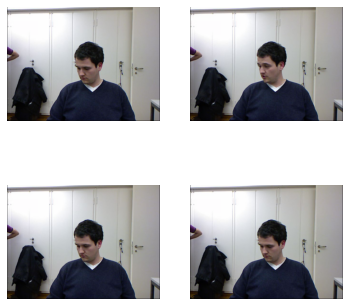

In [0]:
worst = fplot_top_losses(interp, dls, k=4, largest=True)

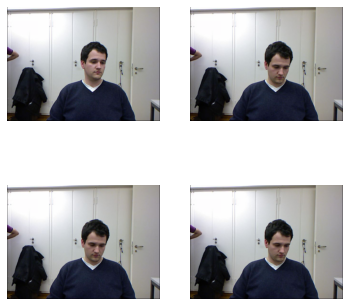

In [0]:
best = fplot_top_losses(interp, dls, k=4, largest=False)

### Class Activation Maps

**Extension activity!**

Class Activation Mapping (or CAM) is a common techique in computer vision for "explaianble AI". It maps the importance of each input (pixel) with respect to the changes of the outputs activations. it's normally visualised as a heatmap over the image to highlight the parts most important for the prediction.

To access the activations inside the model while it's training, we need to use PyTorch *hooks*. For the full tutorial and explanation, see:

* https://github.com/fastai/fastbook/blob/5b414a72dd882227477bce03861636ef89f57b17/18_CAM.ipynb

In [0]:
class Hook():
    def __init__(self, m):
        self.hook = m.register_forward_hook(self.hook_func)   
    def hook_func(self, m, i, o): self.stored = o.detach().clone()
    def __enter__(self, *args): return self
    def __exit__(self, *args): self.hook.remove()

In [0]:
def fshow_cam(learn, dls, x):
    """
    plot class activation map
    """
    with Hook(learn.model[0]) as hook:
        with torch.no_grad(): output = learn.model.eval()(x.cuda())
        act = hook.stored[0]

        cam_map = torch.einsum('ck,kij->cij', learn.model[1][-2].weight, act)

        x_dec = TensorImage(dls.valid.decode((x,))[0][0])
        fig,ax = plt.subplots()
        x_dec.show(ctx=ax)
        im = ax.imshow(cam_map[1].detach().cpu(), alpha=0.4, extent=(0,x.shape[3],x.shape[2],0),
                        interpolation='bilinear', cmap='jet')
        fig.colorbar(im)
        plt.show()

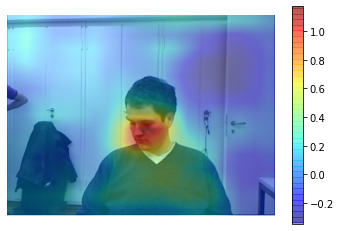

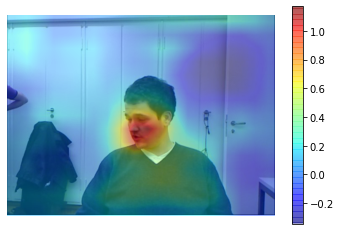

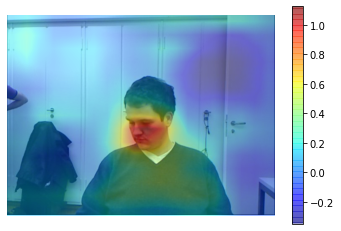

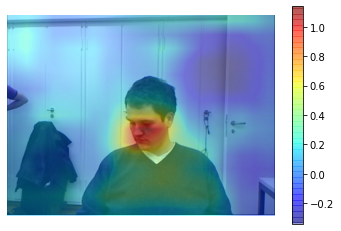

In [0]:
for img in worst:
    im = PILImage.create(img)
    x, = first(dls.test_dl([im]))
    fshow_cam(learn, dls, x)

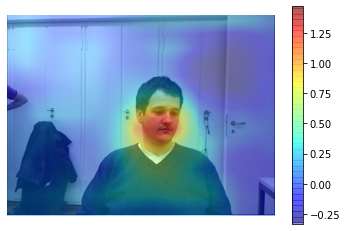

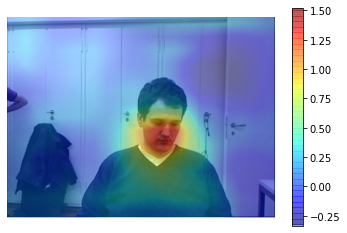

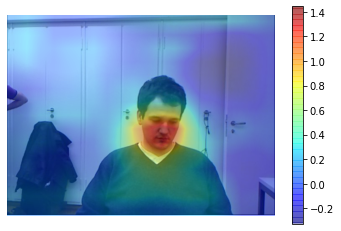

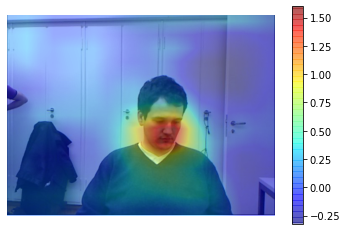

In [0]:
for img in best:
    im = PILImage.create(img)
    x, = first(dls.test_dl([im]))
    fshow_cam(learn, dls, x)